In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.interpolate import interp1d
import matplotlib
from matplotlib.backends.backend_pdf import PdfPages
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

from utils import set_to_nan_based_on_likelihood, plot_ebc,filter_and_interpolate

def ebc_bins(dlc_df, bin_size_angle=6,bin_size_distance=80): 
    top_left_corner = (dlc_df.iloc[0]['top_left_corner x'], dlc_df.iloc[0]['top_left_corner y'])
    top_right_corner = (dlc_df.iloc[0]['top_right_corner x'],dlc_df.iloc[0]['top_right_corner y'])
    bottom_left_corner = (dlc_df.iloc[0]['bottom_left_corner x'], dlc_df.iloc[0]['bottom_left_corner y'])
    bottom_right_corner = (dlc_df.iloc[0]['bottom_right_corner x'], dlc_df.iloc[0]['bottom_right_corner y'])
    angle_bins = np.arange(0,360,bin_size_angle)

    diagonal_distance_arena = math.hypot(top_right_corner[0] - bottom_left_corner[0], top_right_corner[1] - bottom_left_corner[1])
    distance_bins = np.arange(0,diagonal_distance_arena,bin_size_distance)
    return distance_bins,angle_bins

def rotate(origin, point, angle):
    """
    Rotate a point counterclockwise by a given angle around a given origin.

    The angle should be given in radians.
    """
    ox, oy = origin
    px, py = point

    qx = ox + math.cos(angle) * (px - ox) - math.sin(angle) * (py - oy)
    qy = oy + math.sin(angle) * (px - ox) + math.cos(angle) * (py - oy)
    return qx, qy

def lineLineIntersection(A, B, C, D):
    # Line AB represented as a1x + b1y = c1
    a1 = B[1] - A[1]
    b1 = A[0] - B[0]
    c1 = a1*(A[0]) + b1*(A[1])
 
    # Line CD represented as a2x + b2y = c2
    a2 = D[1] - C[1]
    b2 = C[0] - D[0]
    c2 = a2*(C[0]) + b2*(C[1])
 
    determinant = a1*b2 - a2*b1
 
    if (determinant == 0):
        # The lines are parallel. This is simplified
        # by returning a pair of FLT_MAX
        return 'parallel'
    else:
        x = (b2*c1 - b1*c2)/determinant
        y = (a1*c2 - a2*c1)/determinant
        return (x, y)


def calaculate_ebc_head(dlc_df,left_drive_x,left_drive_y,right_drive_x,right_dirve_y,ebc_angle_bin_size,ebc_dist_bin_size):
    top_left_corner = (dlc_df.iloc[0]['top_left_corner x'], dlc_df.iloc[0]['top_left_corner y'])
    top_right_corner = (dlc_df.iloc[0]['top_right_corner x'],dlc_df.iloc[0]['top_right_corner y'])
    bottom_left_corner = (dlc_df.iloc[0]['bottom_left_corner x'], dlc_df.iloc[0]['bottom_left_corner y'])
    bottom_right_corner = (dlc_df.iloc[0]['bottom_right_corner x'], dlc_df.iloc[0]['bottom_right_corner y'])
    distance_bins,angle_bins = ebc_bins(dlc_df,ebc_angle_bin_size,ebc_dist_bin_size)
    ebc_data_final = []
    for i in range(len(left_drive_x)):
        print(i, len(left_drive_x), "egocentric head") #TO VIEW PROGRESS
        ebc_bins_total = np.zeros((len(distance_bins),len(angle_bins)))
        for angle in range(0,360,3):
            center_neck_pos = (left_drive_x[i],left_drive_y[i])
            center_haunch_pos = (right_drive_x[i],right_dirve_y[i]) 
            center_neck_pos = rotate(center_haunch_pos,center_neck_pos,angle=math.radians(-1*angle))
            body_angle_radian_frame = math.atan2(center_haunch_pos[1]-center_neck_pos[1],center_haunch_pos[0]-center_neck_pos[0])

            body_angle_deg_frame = math.degrees(body_angle_radian_frame)

            if body_angle_deg_frame<0:
                body_angle_deg_frame = 360+body_angle_deg_frame
            

            if(body_angle_deg_frame==0):
                #left wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,top_left_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index]+=1

            elif(body_angle_deg_frame>0 and body_angle_deg_frame<90):
                #left wall and top wall
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,top_left_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,top_left_corner,top_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
            
            elif(body_angle_deg_frame==90):
                #top wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,top_left_corner,top_right_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1

            elif(body_angle_deg_frame>90 and body_angle_deg_frame<180):
                #top wall and right wall
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,top_right_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,top_left_corner,top_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
                
            elif(body_angle_deg_frame==180):
                #right wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,top_right_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins) 
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1

            elif(body_angle_deg_frame>180 and body_angle_deg_frame<270):
                #right wall and bottom wall
                
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,top_right_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,bottom_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
            
            elif(body_angle_deg_frame == 270):
                #bottom wall
                interpoint = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_right_corner,bottom_left_corner)
                min_distance = math.hypot(interpoint[0]-center_neck_pos[0],interpoint[1]-center_neck_pos[1])
                distance_bin_index = np.digitize(min_distance,distance_bins)
                angle_bin_index = np.digitize(angle,angle_bins)
                ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
            
            else:
                #bottom wall and left wall
                interpoint_l = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,top_left_corner)
                interpoint_t = lineLineIntersection(center_haunch_pos,center_neck_pos,bottom_left_corner,bottom_right_corner)
                distance_from_point_l = math.hypot(interpoint_l[0]-center_neck_pos[0],interpoint_l[1]-center_neck_pos[1])
                distance_from_point_t = math.hypot(interpoint_t[0]-center_neck_pos[0],interpoint_t[1]-center_neck_pos[1])
                min_distance = min(distance_from_point_l,distance_from_point_t)
                distance_bin_index = np.digitize(min_distance,distance_bins)
                if min_distance<=800:
                    angle_bin_index = np.digitize(angle,angle_bins)
                    #print(i,min_distance,distance_bin_index,angle_bin_index)
                    ebc_bins_total[distance_bin_index-1][angle_bin_index-1]+=1
        
        ebc_data_final.append(ebc_bins_total)
    return np.array(ebc_data_final)

In [117]:
file = r'\\rhea\E\20240701\WT00016L1\FM_DARK\20240701_WT00016_M_FM_DARK_DMS1_angie_ephys_topDLCephys.h5'
dlc_df = pd.read_hdf(file, 'dlc_df')
phy_df = pd.read_hdf(file, 'phy_df')

In [118]:
phy_df

,Amplitude,ContamPct,KSLabel,amp,ch,depth,fr,group,n_spikes,sh,waveform,spikeT,t0
56,2436.6,1.2,good,131.251099,40,575.0,3.172081,good,3919,0,"[0.0281627998, 0.0414571986, 0.0406987481, 0.0...","[0.995400000033333, 1.9994000000333334, 3.1243...",43593.72247
68,3711.3,0.0,good,92.360855,43,500.0,2.259875,good,2792,0,"[0.0427227207, 0.0400894694, 0.0423409417, 0.0...","[6.990033333333333, 8.326933333333335, 8.47666...",43593.72247
69,2489.1,0.0,good,125.135925,43,500.0,4.996493,good,6173,0,"[0.0025756173, 0.005388509, 0.0056064222, 0.00...","[0.03723333333333345, 0.0717666666333332, 0.09...",43593.72247
72,1786.0,1.8,good,101.790352,45,450.0,17.509983,good,21633,0,"[0.0200228021, 0.0164495092, 0.0176134203, 0.0...","[0.010333333333333528, 0.03060000003333352, 0....",43593.72247
75,2943.3,0.0,good,79.627350,46,425.0,1.094323,good,1352,0,"[0.0352826379, 0.034866292, 0.0387787446, 0.04...","[0.6792666666333331, 1.1382000000333332, 1.188...",43593.72247
105,3497.9,0.0,good,124.483841,70,625.0,19.232409,good,23761,0,"[0.0138894832, 0.0104718702, 0.0111505361, 0.0...","[0.008666666633333264, 0.022433333333333305, 0...",43593.72247
117,2749.4,3.2,good,122.970016,75,500.0,10.626754,good,13129,0,"[0.0145330951, 0.0112417918, 0.0119611854, 0.0...","[0.11393333333333322, 0.16090000003333316, 0.2...",43593.72247
126,2157.2,2.7,good,95.225746,82,325.0,2.760091,good,3410,0,"[0.0536563247, 0.0518287309, 0.0538581833, 0.0...","[0.15316666663333312, 0.8592333333333335, 1.95...",43593.72247
136,2408.0,0.0,good,93.095543,88,175.0,4.585312,good,5665,0,"[0.0494298674, 0.0476343334, 0.0500249527, 0.0...","[0.026033333333333353, 0.16810000003333325, 0....",43593.72247
154,2714.3,0.0,good,93.362267,99,700.0,2.771422,good,3424,0,"[0.059644293, 0.056978099, 0.060501758, 0.0614...","[0.4249666666333334, 6.588333333333333, 6.6236...",43593.72247


In [119]:
file = r'\\rhea\E\20240701\WT00016L1\FM_DARK\20240701_WT00016_M_FM_DARK_DMS1_angie_ephys_topDLCephys.h5'
dlc_df = pd.read_hdf(file, 'dlc_df')
phy_df = pd.read_hdf(file, 'phy_df')

fps = 59.99
likelihood_threshold = 0.95
model_dt = 1/fps # Frame duration in seconds
bin_width = 20 #bin width angles
speed_threshold=0.25
ebc_angle_bin_size = 3
ebc_dist_bin_size = 40

columns_of_interest = ['left_drive','right_drive', 'time']

# Adding timestamps to dlc file and only considering columns of interest
dlc_df['time'] = np.arange(len(dlc_df))/fps

#filter and interpolate
model_data_df,model_t = filter_and_interpolate(dlc_df,columns_of_interest,likelihood_threshold,model_dt,fps)

model_data_df = model_data_df[model_data_df['speed']>speed_threshold]

#model_data_df = model_data_df.dropna()

center_neck_x = list(model_data_df['left_drive x'])
center_neck_y = list(model_data_df['left_drive y'])
center_haunch_x = list(model_data_df['right_drive x'])
center_haunch_y = list(model_data_df['right_drive y'])


ebc_data = calaculate_ebc_head(dlc_df, center_neck_x,center_neck_y,center_haunch_x,center_haunch_y,ebc_angle_bin_size,ebc_dist_bin_size)
distance_bins,angle_bins = ebc_bins(dlc_df,ebc_angle_bin_size,ebc_dist_bin_size)

ebc_data_avg = np.sum(ebc_data,axis=0)
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, 121)

model_data_df['egocentric'] = list(ebc_data)

0 129837 egocentric head
1 129837 egocentric head
2 129837 egocentric head
3 129837 egocentric head
4 129837 egocentric head
5 129837 egocentric head
6 129837 egocentric head
7 129837 egocentric head
8 129837 egocentric head
9 129837 egocentric head
10 129837 egocentric head
11 129837 egocentric head
12 129837 egocentric head
13 129837 egocentric head
14 129837 egocentric head
15 129837 egocentric head
16 129837 egocentric head
17 129837 egocentric head
18 129837 egocentric head
19 129837 egocentric head
20 129837 egocentric head
21 129837 egocentric head
22 129837 egocentric head
23 129837 egocentric head
24 129837 egocentric head
25 129837 egocentric head
26 129837 egocentric head
27 129837 egocentric head
28 129837 egocentric head
29 129837 egocentric head
30 129837 egocentric head
31 129837 egocentric head
32 129837 egocentric head
33 129837 egocentric head
34 129837 egocentric head
35 129837 egocentric head
36 129837 egocentric head
37 129837 egocentric head
38 129837 egocentric h

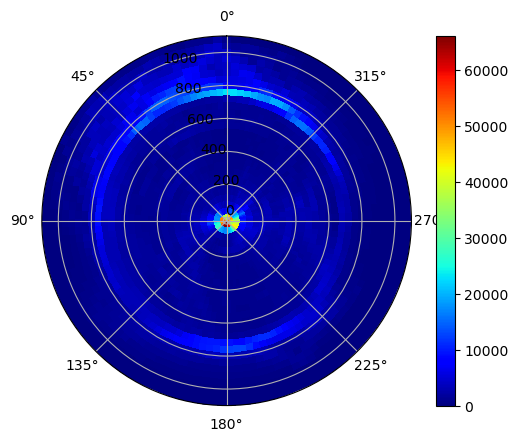

In [120]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, ebc_data_avg, cmap="jet")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

array([30791., 30535., 30394., 30294., 30162., 30002., 29667., 29119.,
       28416., 27654., 27014., 26327., 25426., 24442., 23707., 22847.,
       21894., 20848., 19722., 18463., 17102., 15546., 14318., 13480.,
       12787., 12624., 12271., 11617., 10843., 10701., 10564., 10702.,
       11145., 11600., 12165., 12743., 13486., 14274., 14949., 15599.,
       15887., 16402., 16871., 17482., 18068., 18645., 19302., 19896.,
       20346., 20670., 20934., 21167., 21364., 21534., 21681., 21736.,
       21722., 21631., 21348., 20979., 20423., 19583., 18454., 17364.,
       16516., 15617., 14700., 13498., 12580., 11599., 10773.,  9936.,
        9246.,  8864.,  8511.,  8177.,  8119.,  8041.,  8143.,  8558.,
        8981.,  9630., 10743., 11542., 13073., 14334., 15457., 16417.,
       17320., 18224., 19565., 20700., 21700., 22741., 23990., 25095.,
       25959., 26698., 27291., 27788., 28285., 28989., 29552., 29912.,
       30193., 30434., 30784., 30901., 31082., 31210., 31226., 31242.,
      

In [116]:
phy_df

,Amplitude,ContamPct,KSLabel,amp,ch,depth,fr,group,n_spikes,sh,waveform,spikeT,t0
56,2436.6,1.2,good,131.251099,40,575.0,3.172081,good,3919,0,"[0.0281627998, 0.0414571986, 0.0406987481, 0.0...",[],46433.170803
68,3711.3,0.0,good,92.360855,43,500.0,2.259875,good,2792,0,"[0.0427227207, 0.0400894694, 0.0423409417, 0.0...",[],46433.170803
69,2489.1,0.0,good,125.135925,43,500.0,4.996493,good,6173,0,"[0.0025756173, 0.005388509, 0.0056064222, 0.00...",[],46433.170803
72,1786.0,1.8,good,101.790352,45,450.0,17.509983,good,21633,0,"[0.0200228021, 0.0164495092, 0.0176134203, 0.0...",[],46433.170803
75,2943.3,0.0,good,79.627350,46,425.0,1.094323,good,1352,0,"[0.0352826379, 0.034866292, 0.0387787446, 0.04...",[],46433.170803
105,3497.9,0.0,good,124.483841,70,625.0,19.232409,good,23761,0,"[0.0138894832, 0.0104718702, 0.0111505361, 0.0...",[],46433.170803
117,2749.4,3.2,good,122.970016,75,500.0,10.626754,good,13129,0,"[0.0145330951, 0.0112417918, 0.0119611854, 0.0...",[],46433.170803
126,2157.2,2.7,good,95.225746,82,325.0,2.760091,good,3410,0,"[0.0536563247, 0.0518287309, 0.0538581833, 0.0...",[],46433.170803
136,2408.0,0.0,good,93.095543,88,175.0,4.585312,good,5665,0,"[0.0494298674, 0.0476343334, 0.0500249527, 0.0...",[],46433.170803
154,2714.3,0.0,good,93.362267,99,700.0,2.771422,good,3424,0,"[0.059644293, 0.056978099, 0.060501758, 0.0614...",[],46433.170803


In [121]:
cell_numbers = phy_df.index
ebc_plot_data = []
for i in cell_numbers:
    spike_times = phy_df.loc[i]['spikeT']

    #removing spike times after camera stopped
    spike_times = spike_times[spike_times<=max(model_t)]

    #binning spikes
    sp_count_ind = np.digitize(spike_times,bins = model_t)

    #-1 because np.digitze is 1-indexed
    sp_count_ind = [i-1 for i in sp_count_ind]

    sp_count_ind = [i for i in sp_count_ind if i in model_data_df.index]

    cell_spikes_egocentric = model_data_df['egocentric'].loc[sp_count_ind]  

    cell_spikes_avg = np.sum(cell_spikes_egocentric,axis = 0)
    cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
    
    cell_spikes_avg[np.isnan(cell_spikes_avg)] = 0
    
    ebc_plot_data.append(cell_spikes_avg)


C:\Users\plab\AppData\Local\Temp\ipykernel_43244\374533348.py:20: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_43244\374533348.py:20: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_43244\374533348.py:20: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_43244\374533348.py:20: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_43244\374533348.py:20: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
C:\Users\plab\AppData\Local\Temp\ipykernel_43244\374533348.py:20: RuntimeWarning: invalid value encountered in

0.0

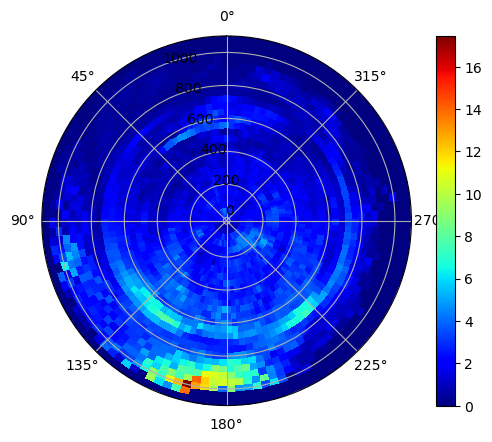

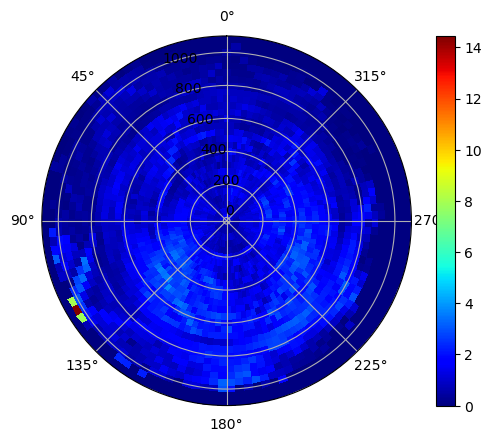

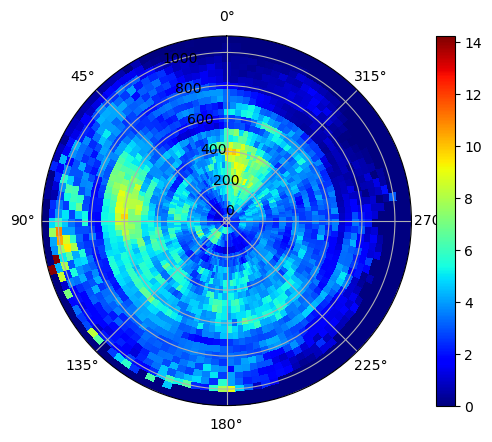

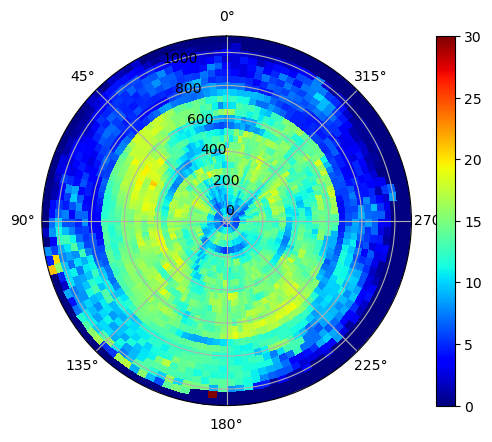

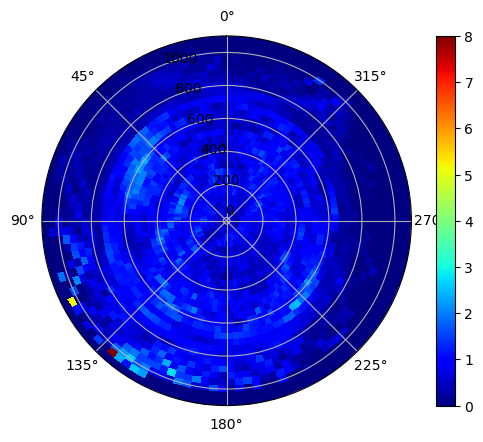

...

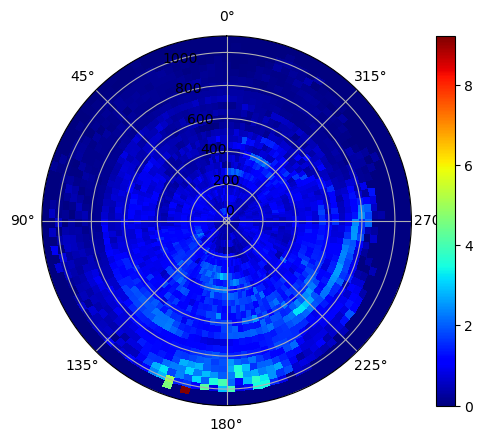

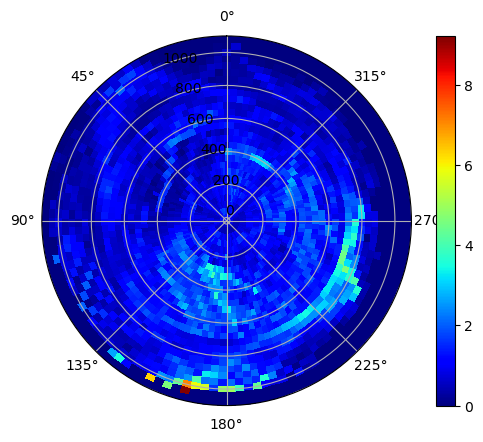

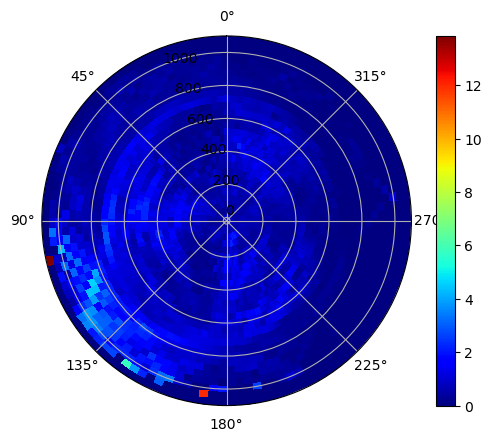

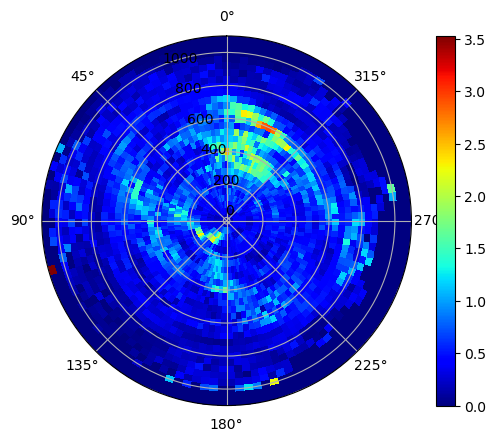

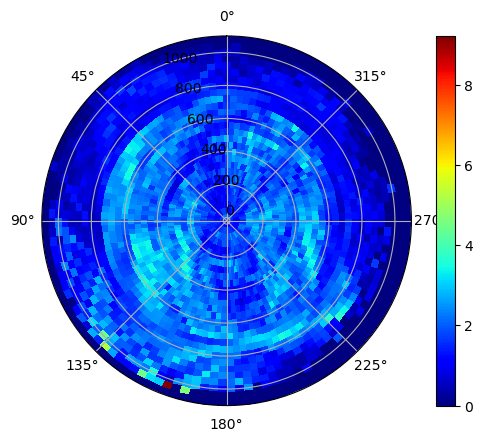

In [123]:
for ebc in ebc_plot_data:
    rbins = distance_bins.copy()
    abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

    A, R = np.meshgrid(abins, rbins)
    fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
    pc = ax.pcolormesh(A, R, ebc*60, cmap="jet")
    ax.set_theta_direction(1)
    ax.set_theta_offset(np.pi / 2.0)
    fig.colorbar(pc)  
    plt.show()  

C:\Users\plab\AppData\Local\Temp\ipykernel_43244\3191192605.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax1 = plt.subplot(121,projection='polar')


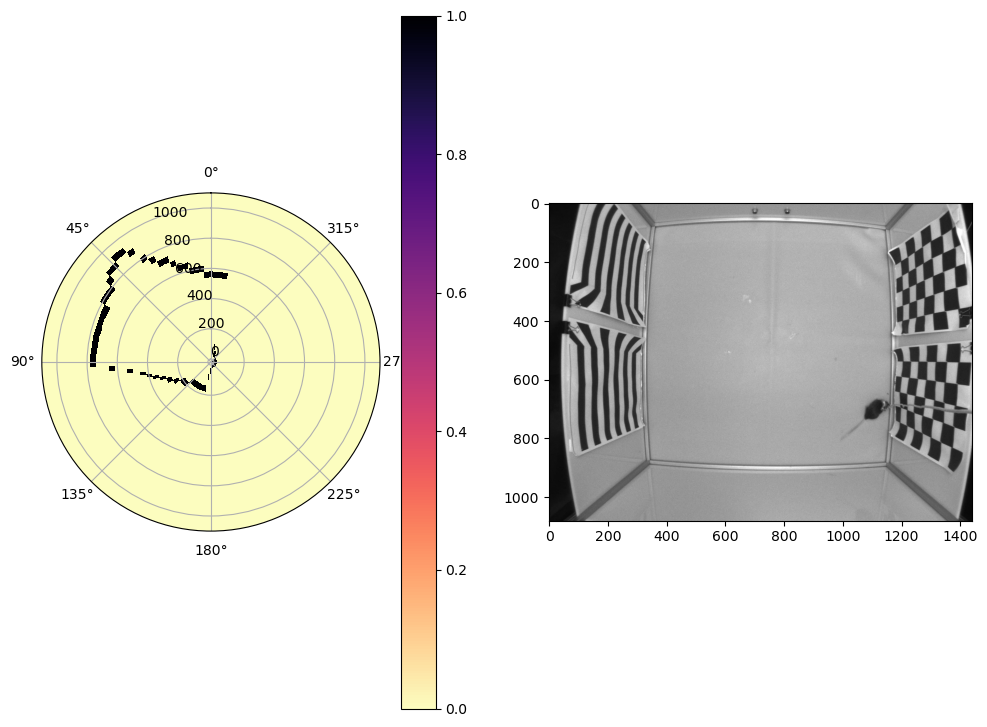

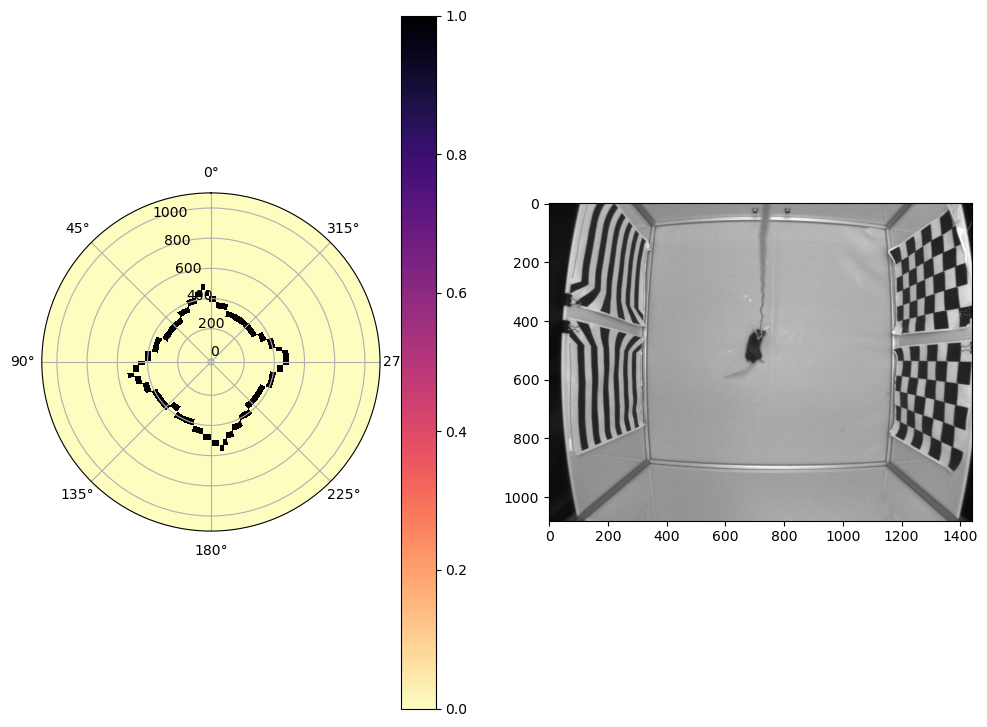

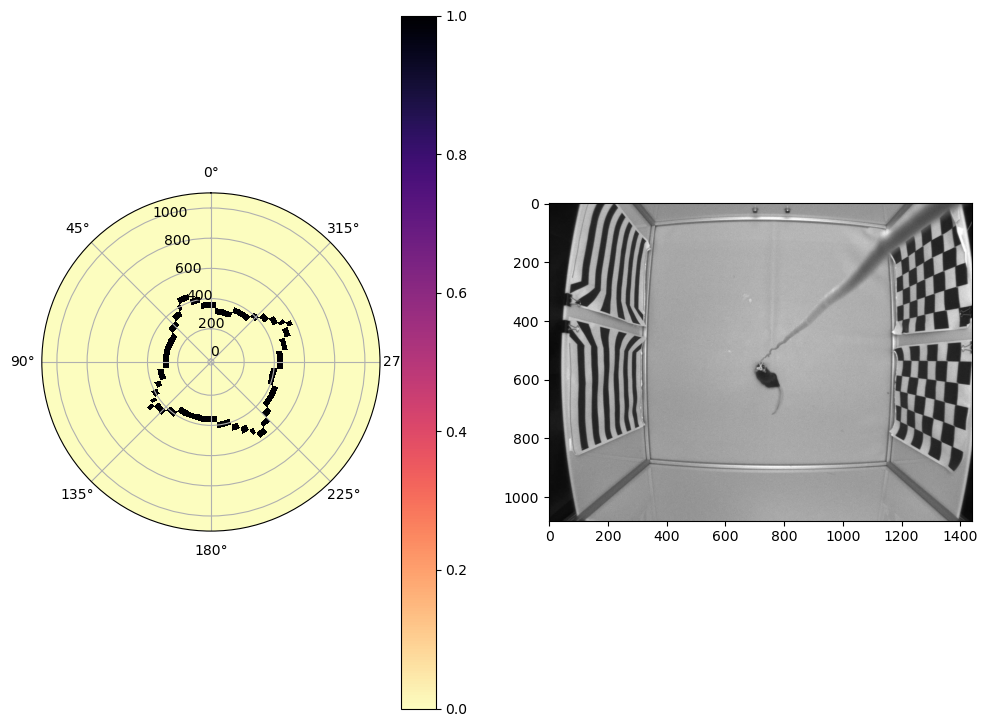

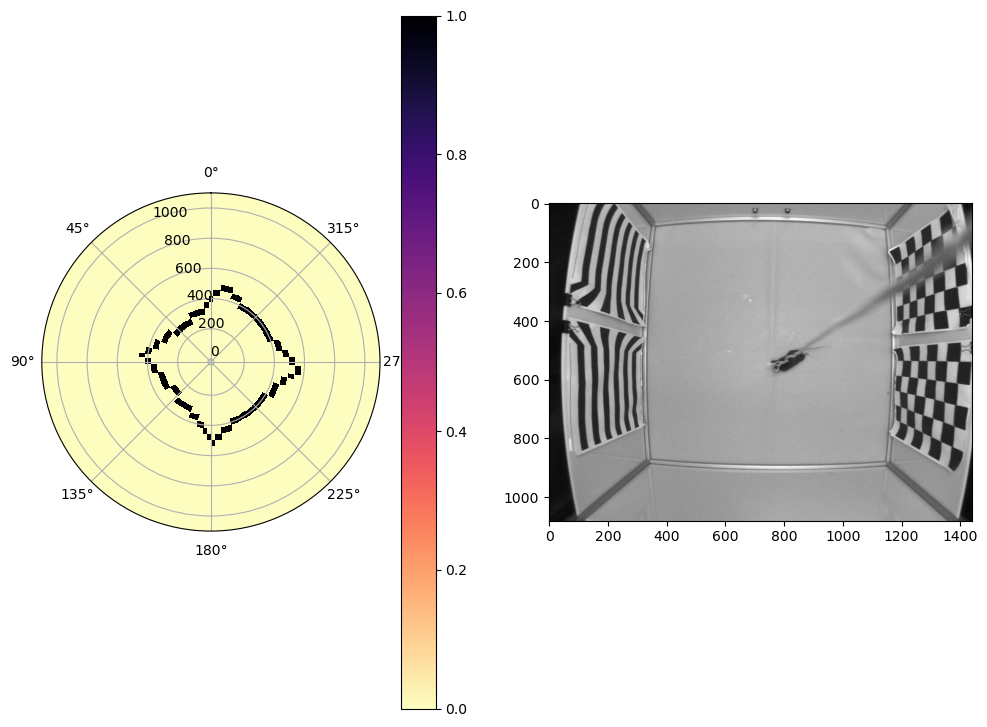

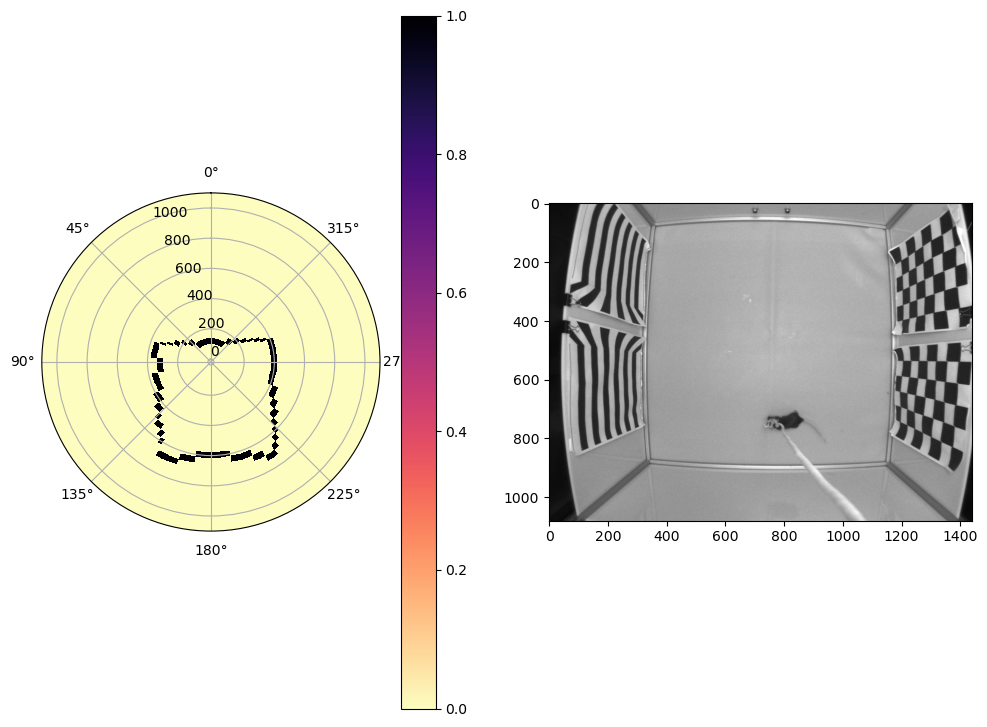

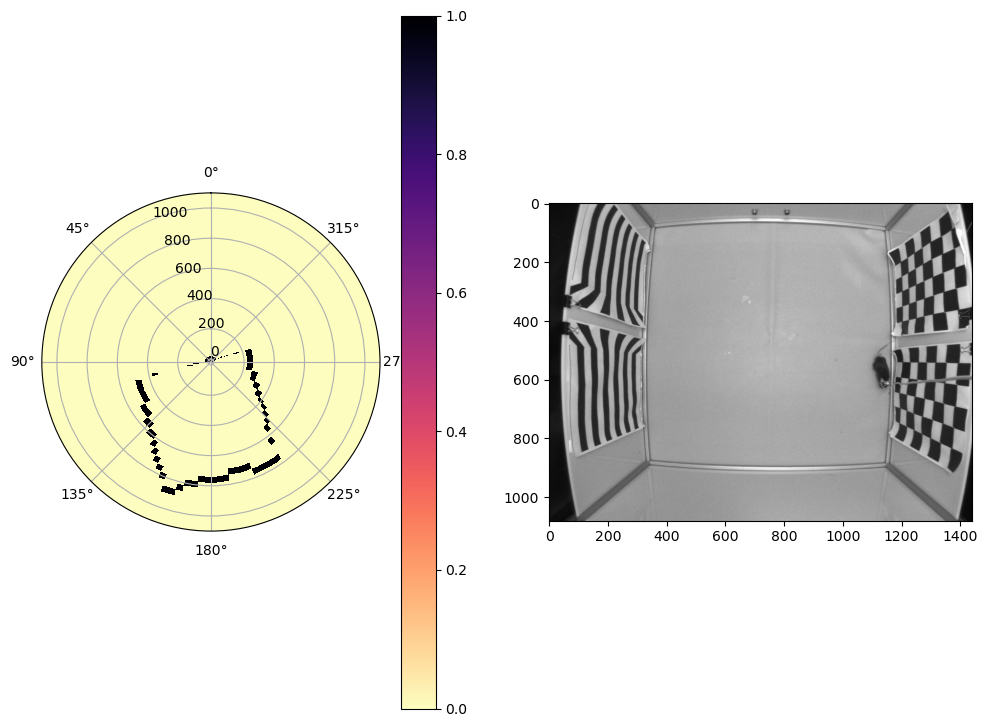

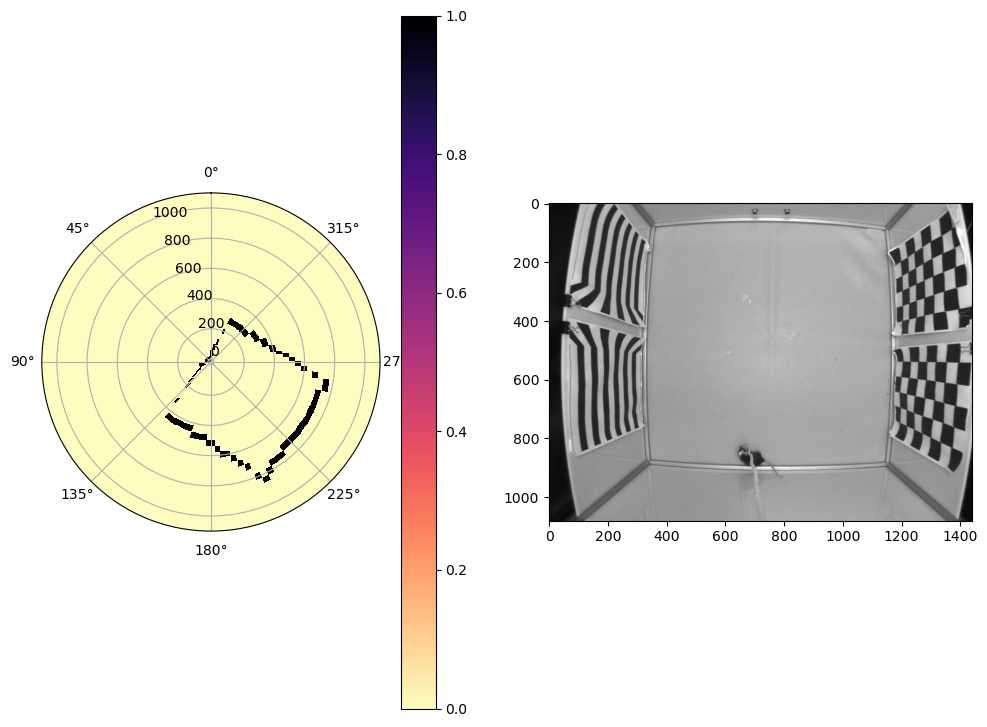

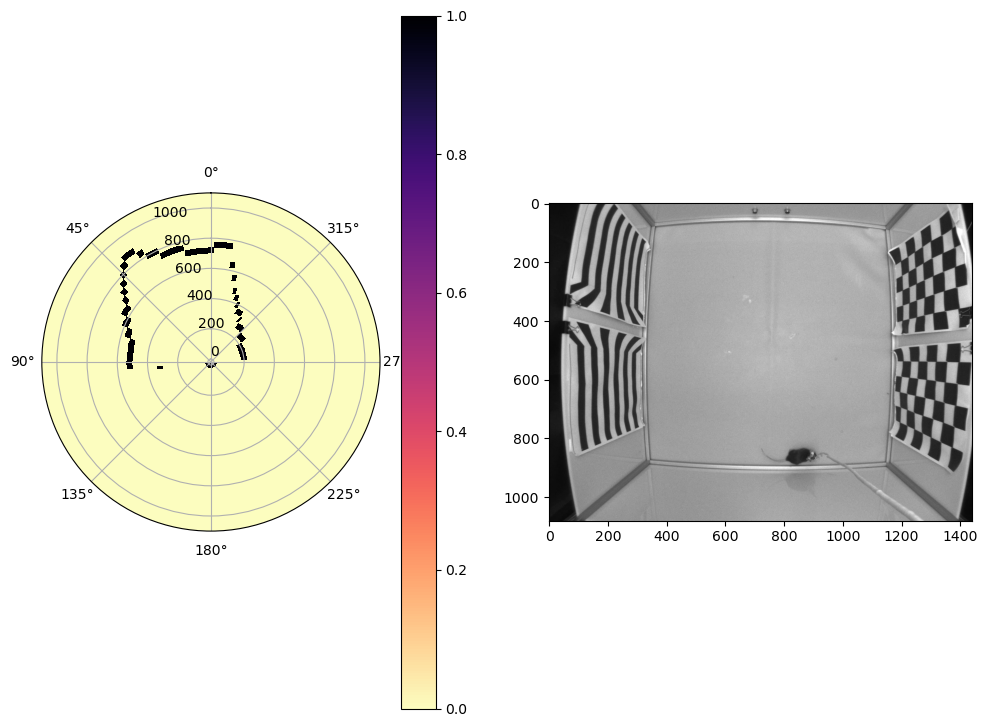

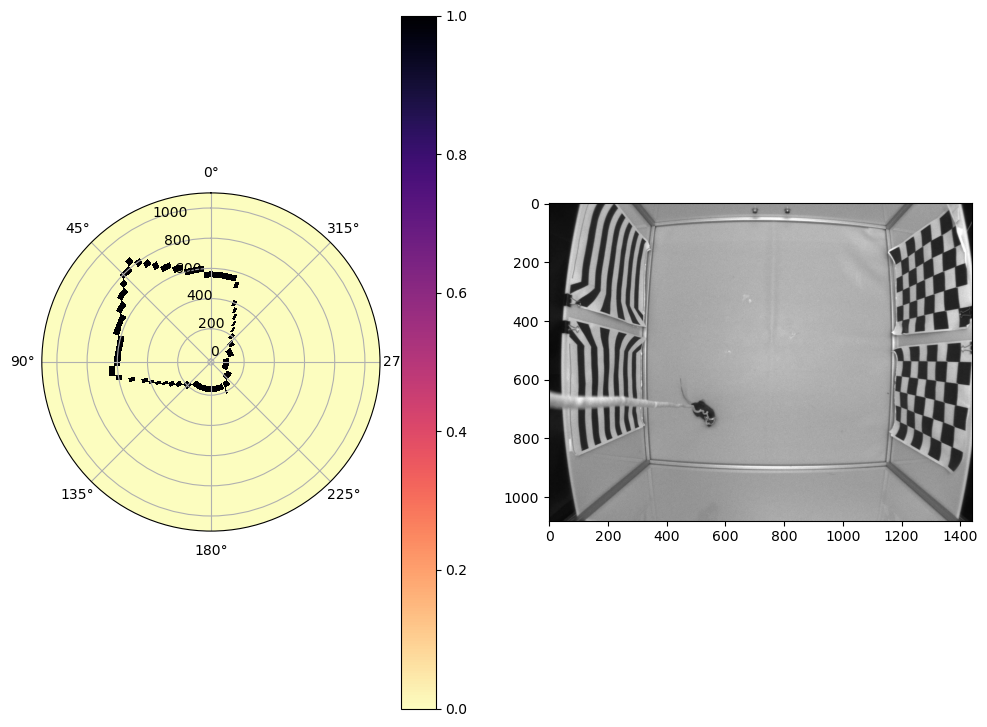

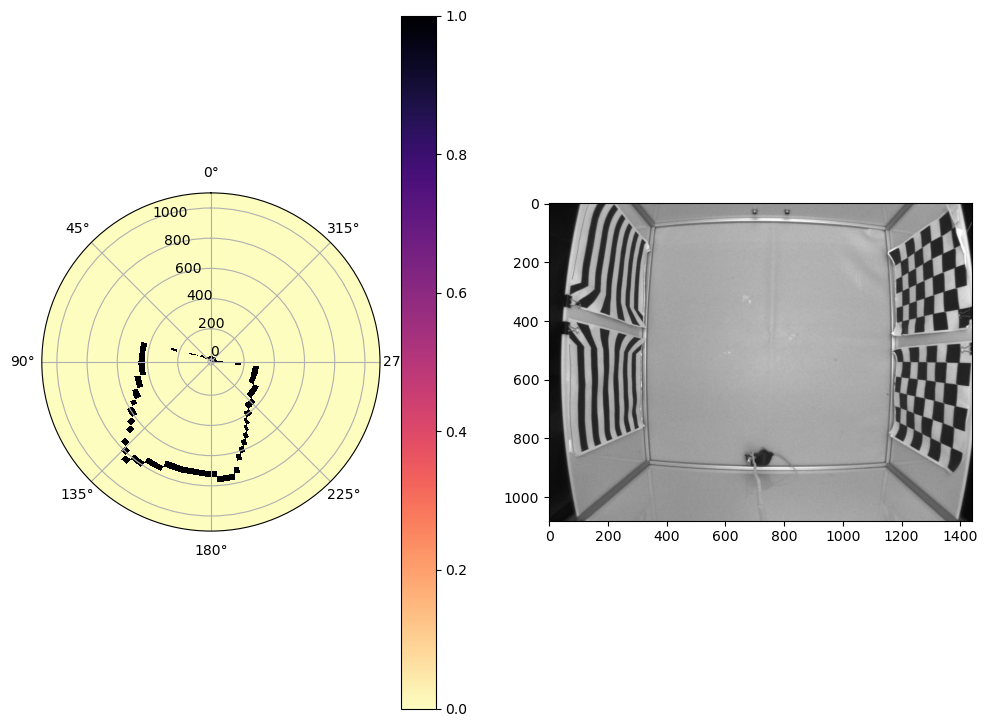

In [ ]:
import cv2
random_frames = np.random.randint(len(model_data_df)-1,size=10)
for i in random_frames:
    vid_file = r'\\rhea\E\20240706\WT00018L1\FM_LIGHT\20240706_WT00018L1_M_FM_LIGHT_DMS_angie_TOP1.avi'
    # vid_file = r"\\rhea\E\20240706\WT00018L1\FM_LIGHT\20240706_WT00018L1_M_FM_LIGHT_DMS_angie_TOP1.avi"

    vid = cv2.VideoCapture(vid_file)
    length = int(vid.get(cv2.CAP_PROP_FRAME_COUNT))

    vid.set(cv2.CAP_PROP_POS_FRAMES,i)
    ret, frame_1 = vid.read()

    fig, (ax1,ax2)= plt.subplots(1,2, figsize=(12,9))

    ax1 = plt.subplot(121,projection='polar')
    rbins = distance_bins.copy()
    abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

    A, R = np.meshgrid(abins, rbins)

    pc = ax1.pcolormesh(A, R, model_data_df.iloc[i]['egocentric'], cmap="magma_r")
    ax1.set_theta_direction(1)
    ax1.set_theta_offset(np.pi / 2.0)
    fig.colorbar(pc)

    ax2 = plt.subplot(122)
    ax2.imshow(frame_1)
    

In [77]:
#np.sum(np.isnan(cell_spikes_avg))
cell_spikes_avg[np.isnan(cell_spikes_avg)] = 0

In [ ]:
cell_spikes_sum = 

In [51]:
np.max(cell_spikes_avg)

1.0

<StemContainer object of 3 artists>

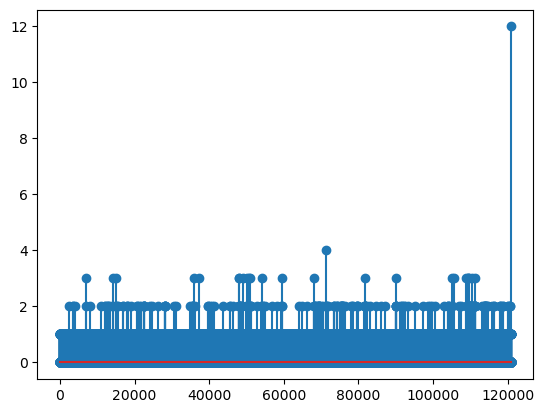

In [52]:
plt.stem(spike_data)

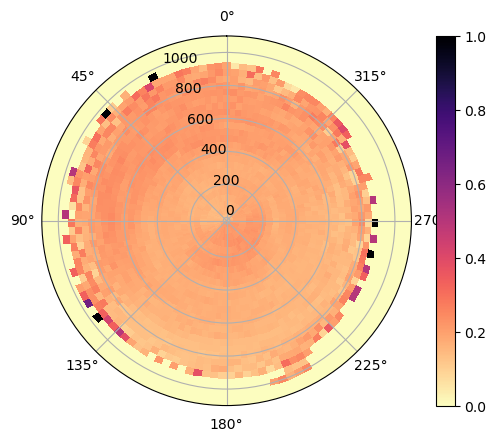

In [78]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, cell_spikes_avg, cmap="magma_r")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

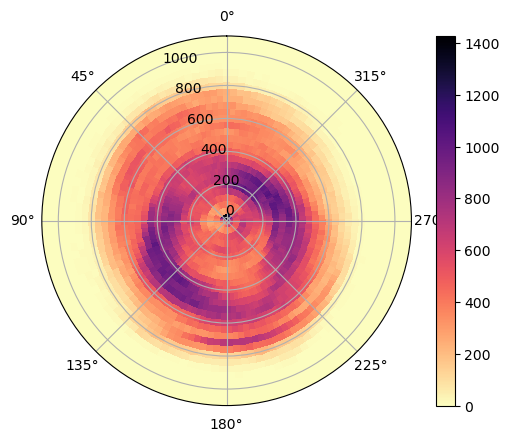

In [76]:
rbins = distance_bins.copy()
abins = np.linspace(0,2*np.pi, (360//ebc_angle_bin_size))

A, R = np.meshgrid(abins, rbins)
fig, ax = plt.subplots(subplot_kw=dict(projection="polar"))
pc = ax.pcolormesh(A, R, cell_spikes_sum, cmap="magma_r")
ax.set_theta_direction(1)
ax.set_theta_offset(np.pi / 2.0)
fig.colorbar(pc)  
plt.show()  

C:\Users\plab\AppData\Local\Temp\ipykernel_36784\1976439483.py:2: RuntimeWarning: invalid value encountered in divide
  cell_spikes_avg = np.divide(cell_spikes_avg,ebc_data_avg)
